# Custom Training with YOLOv5

Train a custom YOLOv5 model to recognize the objects in our dataset.

* Gather a dataset of images and label our dataset
* Export the dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work





# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16656, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 16656 (delta 1), reused 5 (delta 0), pack-reused 16649
Receiving objects: 100% (16656/16656), 15.07 MiB | 10.63 MiB/s, done.
Resolving deltas: 100% (11443/11443), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 55.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 61.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 69.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following depe

## *Download annoted dataset from roboflow universe*

The annoated dataset link :https://universe.roboflow.com/crack-detection-dataset/merged_crack_det-ii/dataset/1

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Your api key")
project = rf.workspace("crack-detection-dataset").project("merged_crack_det-ii")
version = project.version(1)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to merged_crack_det-II-1 in yolov5pytorch:: 100%|██████████| 3706/3706 [00:00<00:00, 5214.12it/s]


In [ ]:

dataset.location

'/content/yolov5/merged_crack_det-II-1'

In [ ]:
dataset.name

'merged_crack_det-II'

In [ ]:
dataset.version

'1'

In [ ]:
dataset.model_format

'yolov5pytorch'

In [ ]:
##Dataset overview

%cat {dataset.location}/data.yaml #The dataset has nc=2, meaning it has 2 classes:crack and fissures

#The dataset(merged_crack_det-II) is divided into training, validation, and test sets.

names:
- crack
- fissures
nc: 2
roboflow:
  license: CC BY 4.0
  project: merged_crack_det-ii
  url: https://universe.roboflow.com/crack-detection-dataset/merged_crack_det-ii/dataset/1
  version: 1
  workspace: crack-detection-dataset
test: ../test/images
train: merged_crack_det-II-1/train/images
val: merged_crack_det-II-1/valid/images


In [ ]:
#Details of image pre-processing

%cat /content/yolov5/merged_crack_det-II-1/README.roboflow.txt




merged_crack_det-II - v1 2023-08-22 12:58am

This dataset was exported via roboflow.com on August 29, 2023 at 12:14 PM GMT

Roboflow is an end-to-end computer vision platform that helps you
* collaborate with your team on computer vision projects
* collect & organize images
* understand and search unstructured image data
* annotate, and create datasets
* export, train, and deploy computer vision models
* use active learning to improve your dataset over time

For state of the art Computer Vision training notebooks you can use with this dataset,
visit https://github.com/roboflow/notebooks

To find over 100k other datasets and pre-trained models, visit https://universe.roboflow.com

The dataset includes 1847 images.
Crack are annotated in YOLO v5 PyTorch format.

The following pre-processing was applied to each image:
* Auto-orientation of pixel data (with EXIF-orientation stripping)
* Resize to 640x640 (Stretch)

No image augmentation techniques were applied.




In [ ]:
#class and assigned label

import yaml


yaml_file_path = '/content/yolov5/merged_crack_det-II-1/data.yaml'


with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)


class_names = data['names']

print("class and assigned label:")

for idx, class_name in enumerate(class_names):
    print(f'{class_name} {idx}')


class and assigned label:
crack 0
fissures 1


In [ ]:
 #the number of  classes in train,valid,test set


from pathlib import Path

def count_labels(train_dir):
  """
  Counts the number of objects per class in a YOLOv5 training set directory.

  Args:
      train_dir: Path to the directory containing label files (txt format).

  Returns:
      A dictionary where the key is the class ID and the value is the count of objects belonging to that class.
  """
  class_counts = {}
  train_path = Path(train_dir)


  for label_file in train_path.glob("*.txt"):
    with open(label_file, "r") as f:
      for line in f:

        class_id = int(line.split()[0])


        if class_id not in class_counts:
          class_counts[class_id] = 0
        class_counts[class_id] += 1
  sorted_counts = dict(sorted(class_counts.items()))


  return sorted_counts


train_set_path = "/content/yolov5/merged_crack_det-II-1/train/labels"
class_counts = count_labels(train_set_path)

print("class freq in train set:")
for class_id, count in class_counts.items():
  print(f"Class {class_id}: {count} ")


valid_set_path = "/content/yolov5/merged_crack_det-II-1/valid/labels"
class_counts = count_labels(valid_set_path)

print("class freq in valid set:")
for class_id, count in class_counts.items():
  print(f"Class {class_id}: {count} ")


test_set_path = "/content/yolov5/merged_crack_det-II-1/test/labels"
class_counts = count_labels(test_set_path)

print("class freq in test set:")
for class_id, count in class_counts.items():
  print(f"Class {class_id}: {count} ")


 #class label 0 :crack
 #class label 1:fissures

class freq in train set:
Class 0: 989 
Class 1: 689 
class freq in valid set:
Class 0: 101 
Class 1: 109 
class freq in test set:
Class 0: 110 
Class 1: 94 


Train ,validation and test set
 ratio

In [ ]:
import os

def count_images(directory):
  """Counts the number of image files in a directory.

  Args:
      directory (str): The path to the directory containing the images.

  Returns:
      int: The number of image files in the directory.
  """

  image_count = 0
  for filename in os.listdir(directory):
    # Check if the filename ends with a common image extension
    if filename.lower().endswith((".jpg", ".jpeg", ".png", ".bmp")):
      image_count += 1

  return image_count

total_images = 0
dataset_paths = [
  '/content/yolov5/merged_crack_det-II-1/train/images',
  '/content/yolov5/merged_crack_det-II-1/valid/images',
  '/content/yolov5/merged_crack_det-II-1/test/images'
]

for image_dir in dataset_paths:
  number_of_images = count_images(image_dir)
  total_images += number_of_images
  print(f"Number of images in '{image_dir}': {number_of_images}")


for image_dir in dataset_paths:
  number_of_images = count_images(image_dir)
  percentage = (number_of_images / total_images) * 100
  print(f"Percentage of images in '{image_dir}': {percentage:.2f}%")


Number of images in '/content/yolov5/merged_crack_det-II-1/train/images': 1487
Number of images in '/content/yolov5/merged_crack_det-II-1/valid/images': 179
Number of images in '/content/yolov5/merged_crack_det-II-1/test/images': 181
Percentage of images in '/content/yolov5/merged_crack_det-II-1/train/images': 80.51%
Percentage of images in '/content/yolov5/merged_crack_det-II-1/valid/images': 9.69%
Percentage of images in '/content/yolov5/merged_crack_det-II-1/test/images': 9.80%


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-06-02 01:01:12.082155: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-02 01:01:12.082213: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-02 01:01:12.083726: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/merged_crack_det-II-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, mult

In [ ]:
#!python val.py --weights runs/train/exp3/weights/best.pt --img 416  --data {dataset.location}/data.yaml

# **Training result**

In [ ]:
import glob
from IPython.display import Image, display

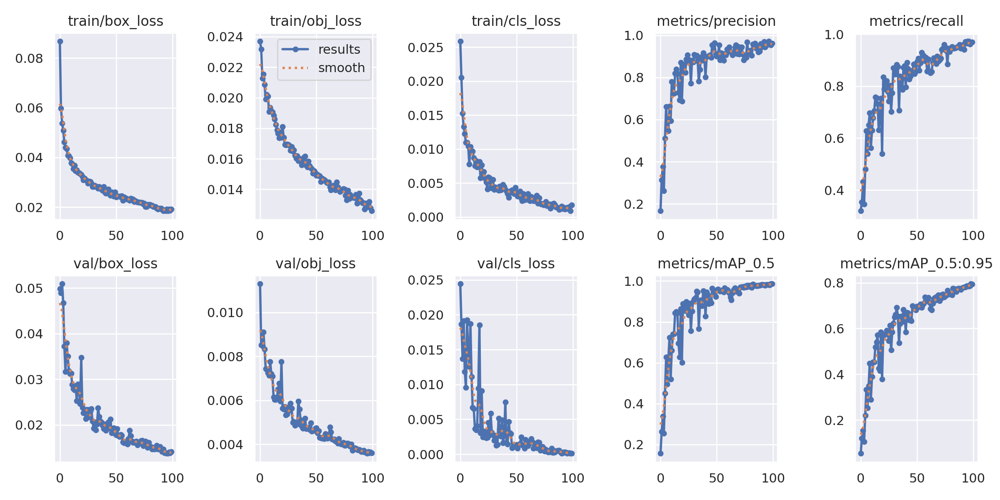

In [ ]:


for imageName in glob.glob('/content/yolov5/runs/train/exp2/results.png'):
    display(Image(filename=imageName))
    print("\n")

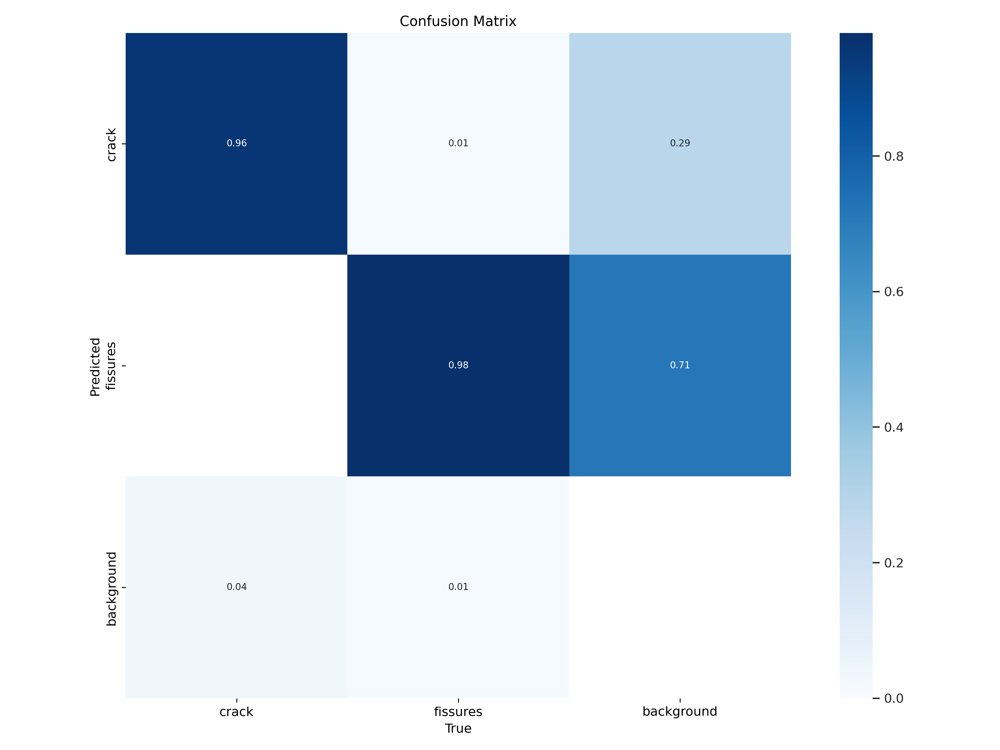

In [ ]:

for imageName in glob.glob('/content/yolov5/runs/train/exp2/confusion_matrix.png'):
    display(Image(filename=imageName))
    print("\n")

**Visualize Our validation data with Labels**

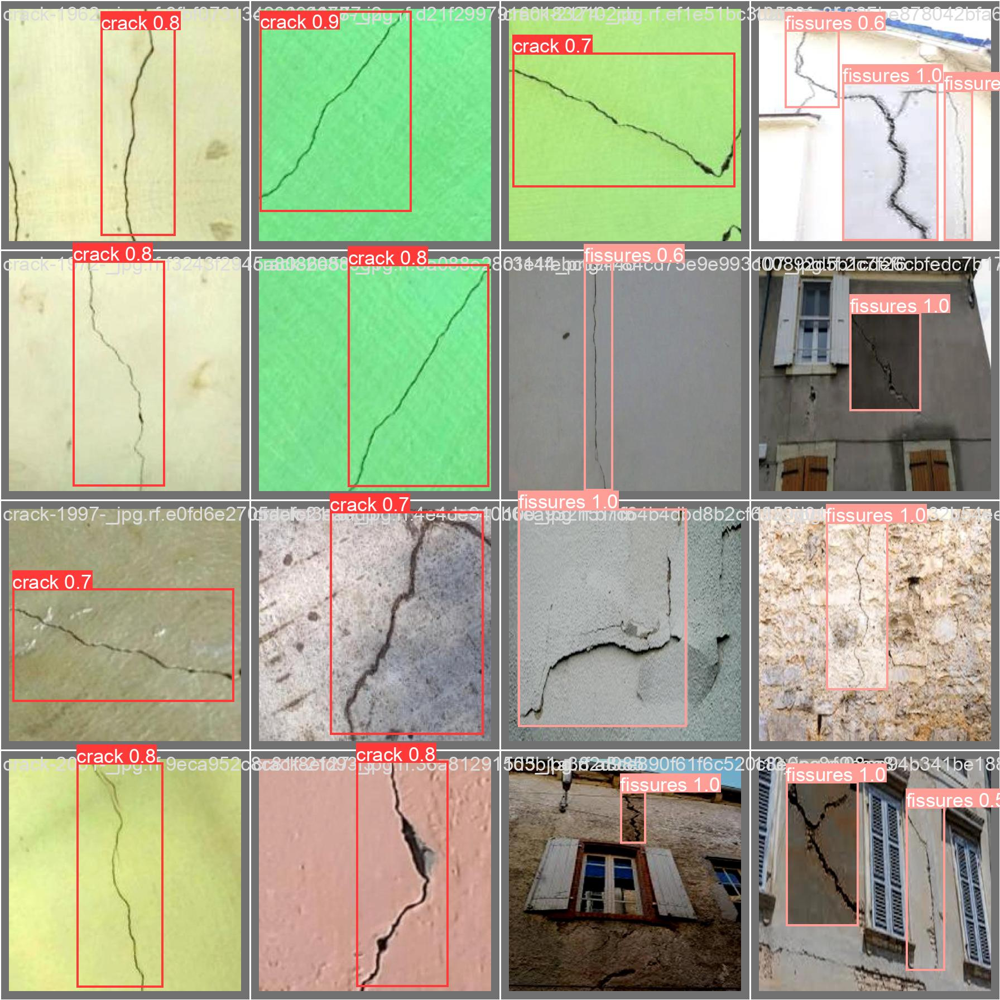

In [ ]:
for imageName in glob.glob('/content/yolov5/runs/train/exp2/val_batch0_pred.jpg'):
    display(Image(filename=imageName))
    print("\n")

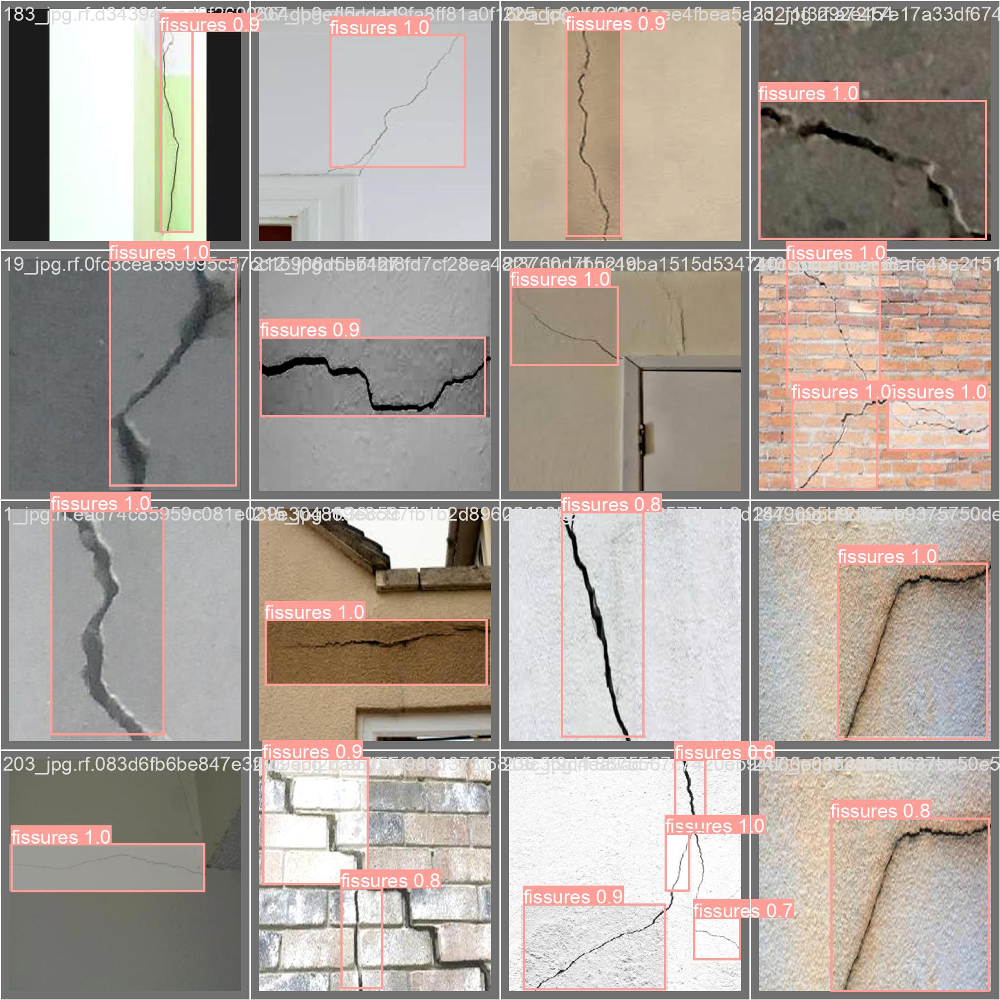

In [ ]:

for imageName in glob.glob('/content/yolov5/runs/train/exp2/val_batch1_pred.jpg'):
    display(Image(filename=imageName))
    print("\n")

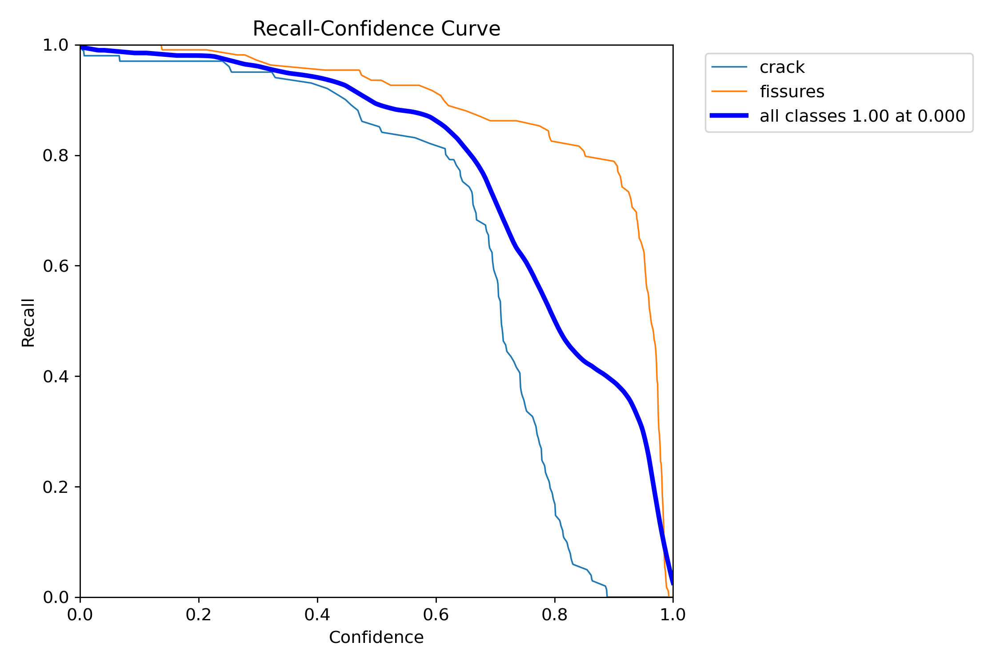

In [ ]:
display(Image(filename="/content/yolov5/runs/train/exp2/R_curve.png"))

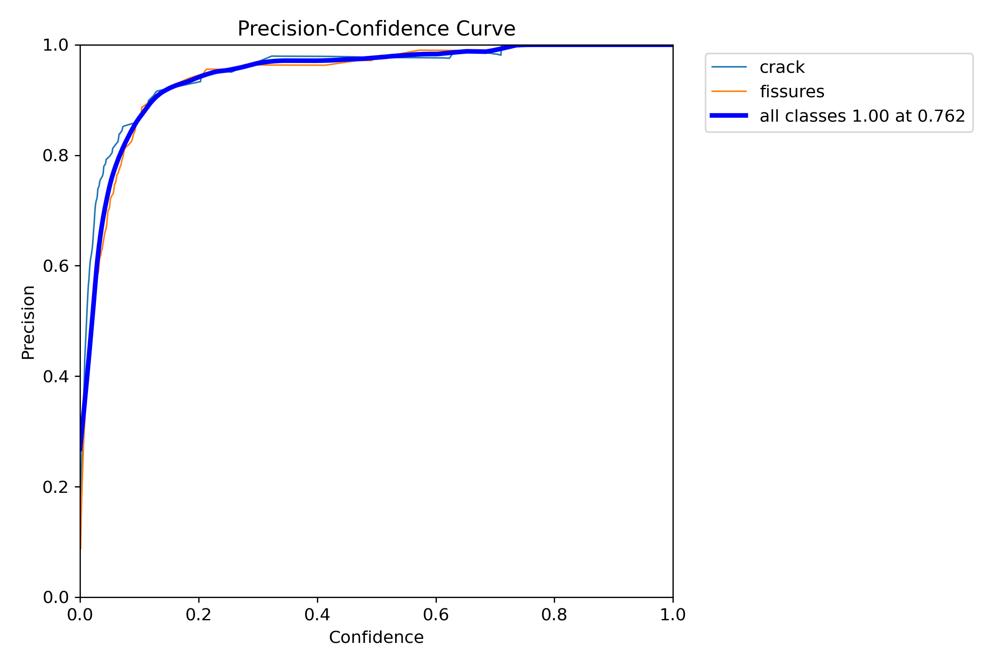

In [ ]:
display(Image(filename="/content/yolov5/runs/train/exp2/P_curve.png"))

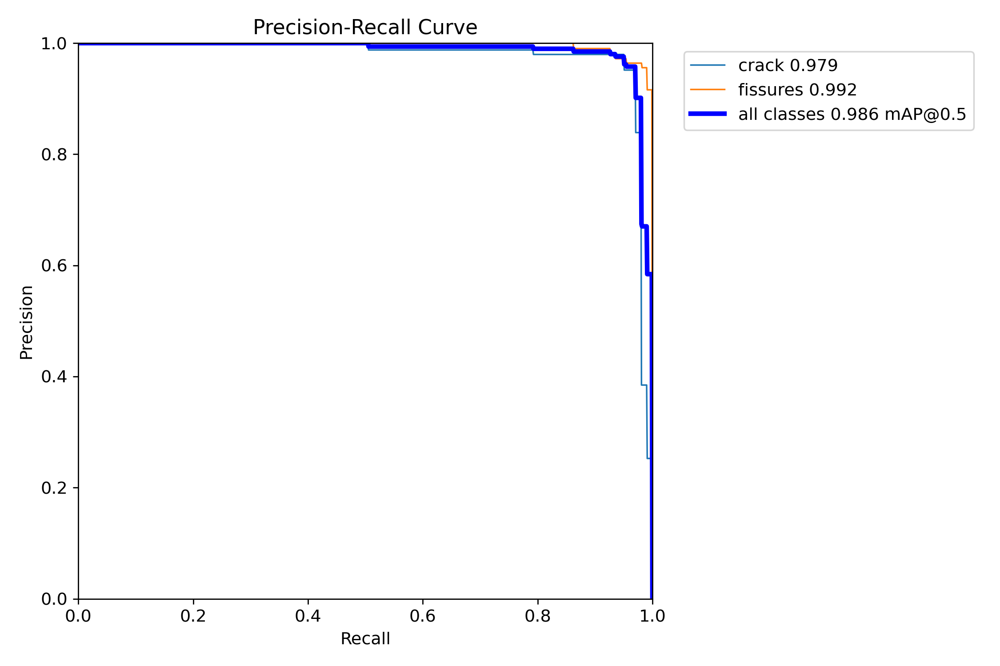

In [ ]:
display(Image(filename="/content/yolov5/runs/train/exp2/PR_curve.png"))

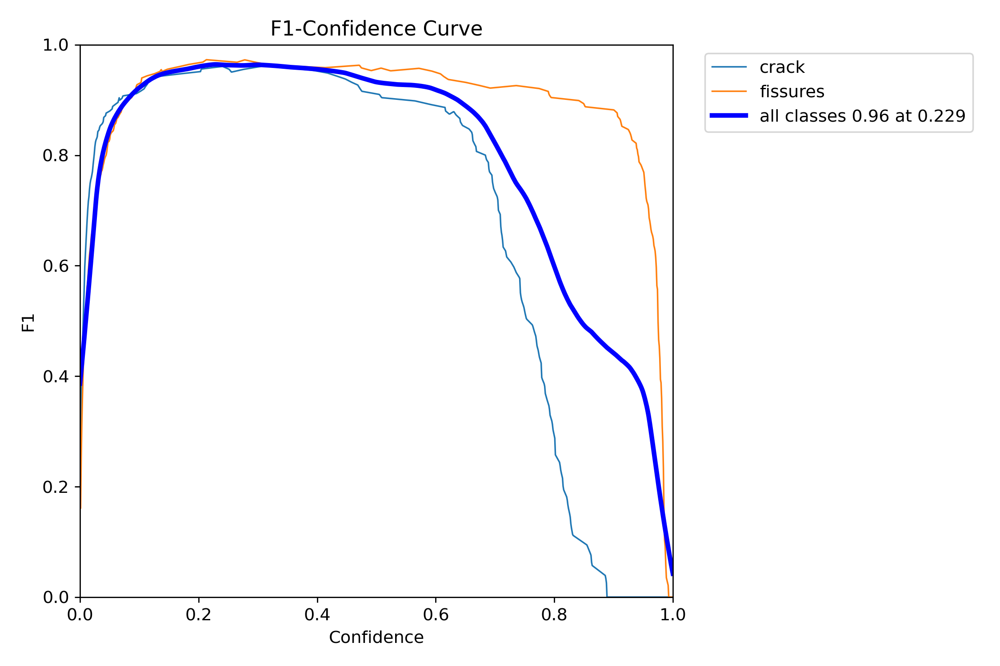

In [ ]:
display(Image(filename="/content/yolov5/runs/train/exp2/F1_curve.png"))

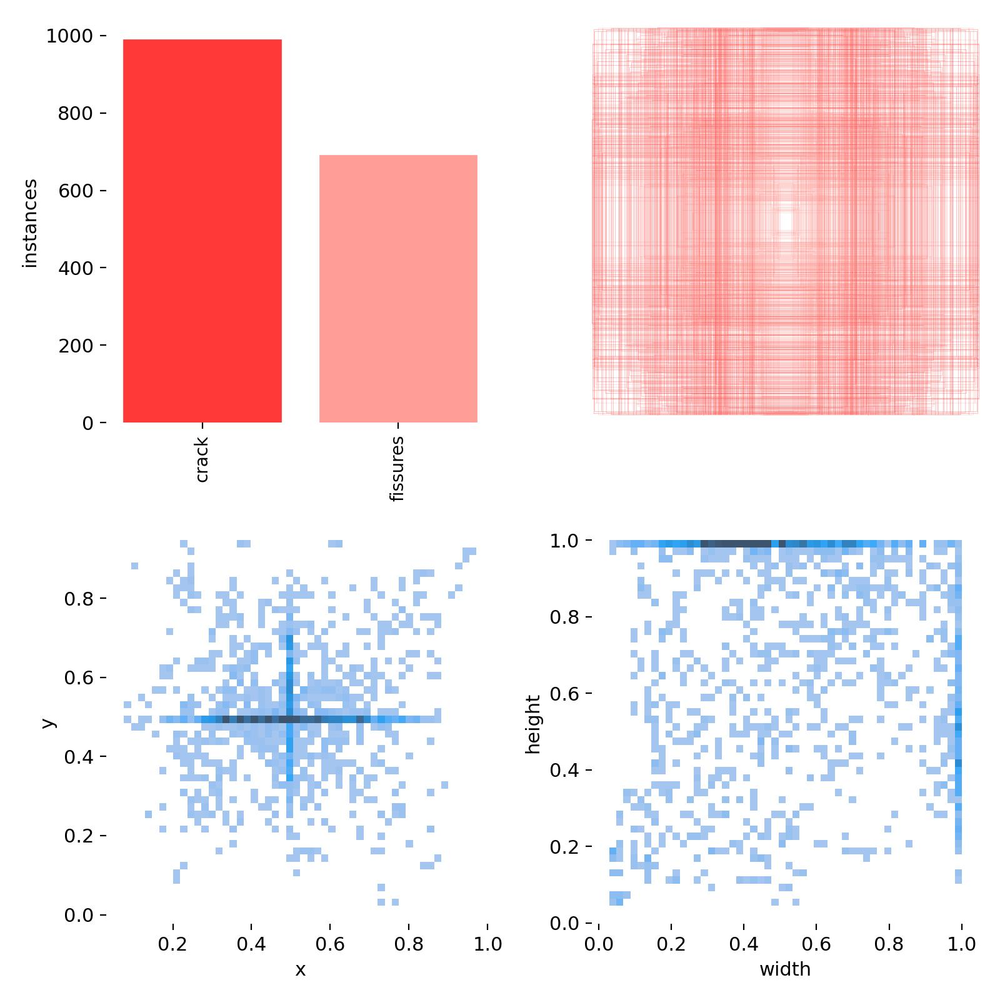

In [ ]:
display(Image(filename="/content/yolov5/runs/train/exp2/labels.jpg"))

 ** **Detecting object on test dataset using our trained model****

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/yolov5/merged_crack_det-II-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-318-gc0380fd8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/181 /content/yolov5/merged_crack_det-II-1/test/images/01143_png.rf.356156bcfd7cfaf3ca13a5ed692a0711.jpg: 416x416 2 fissuress, 7.1ms
image 2/181 /content/yolov5/merged_crack_det-II-1/test/images/01546_png.rf.dc76958cbc72fc60eec37f0029c6cbf8.jpg: 416x

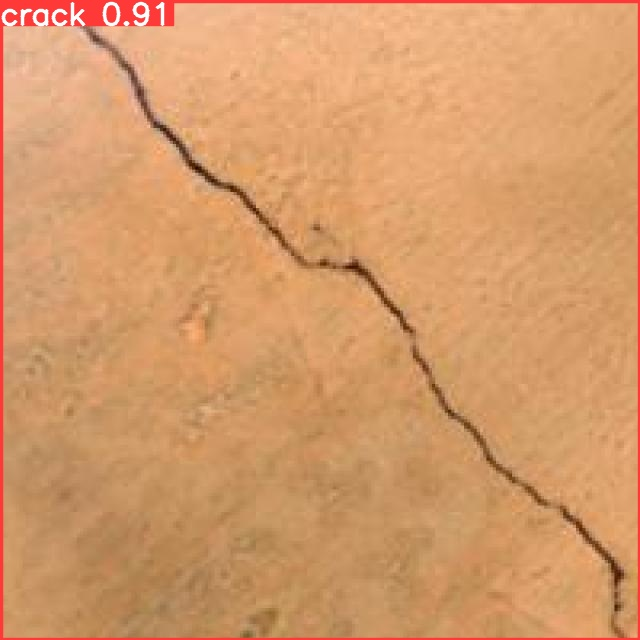

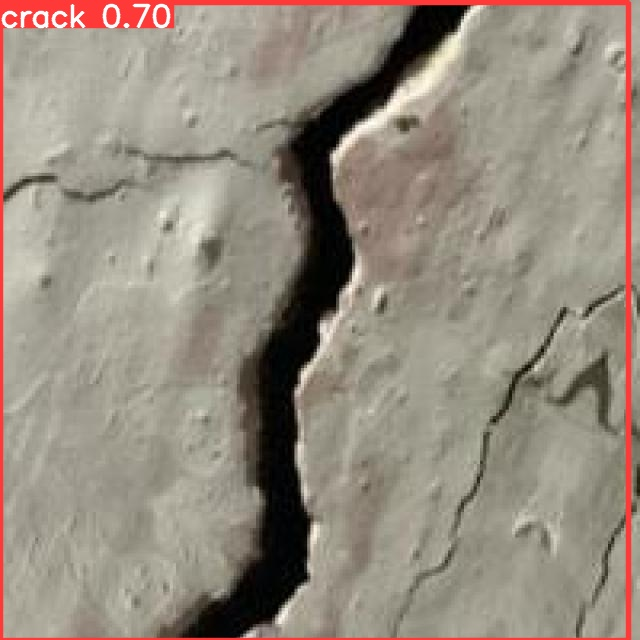

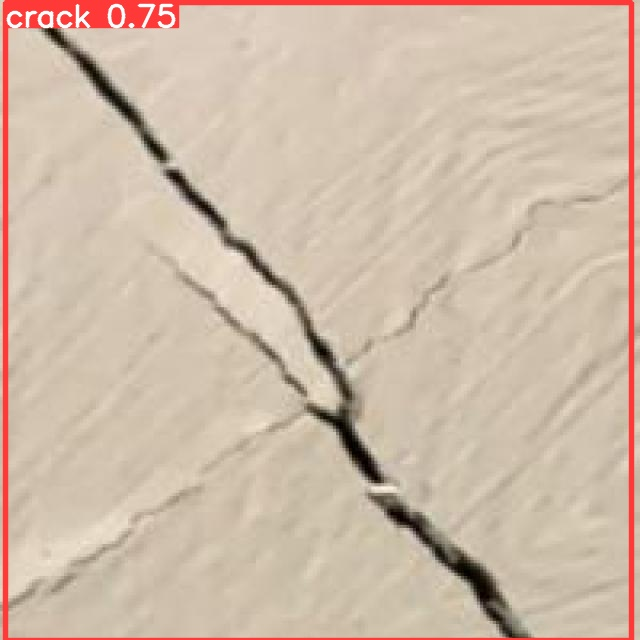

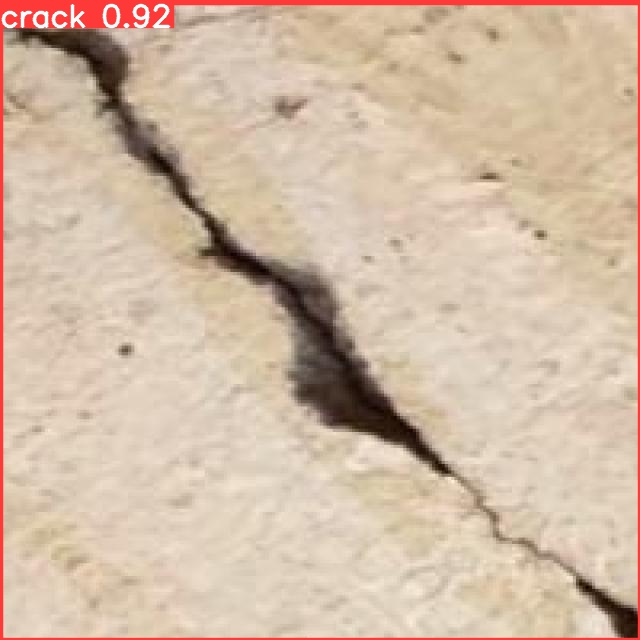

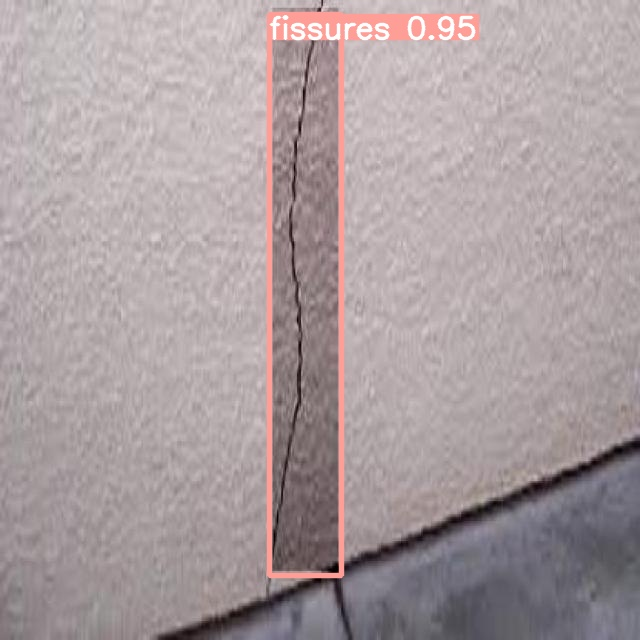

...

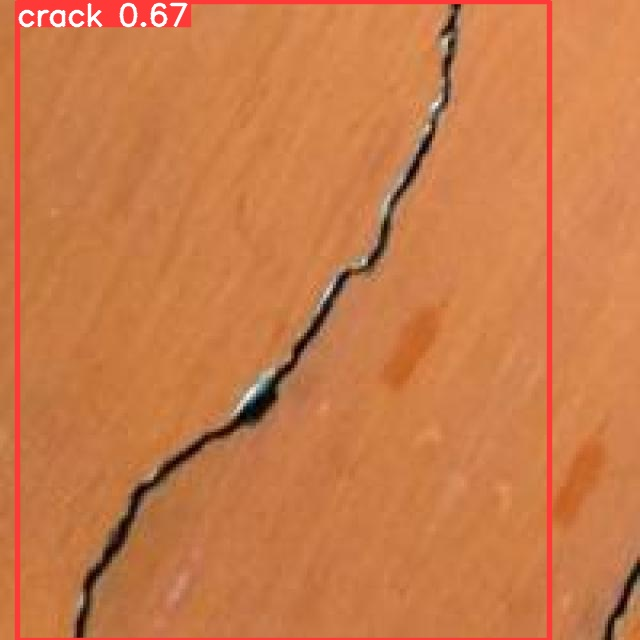

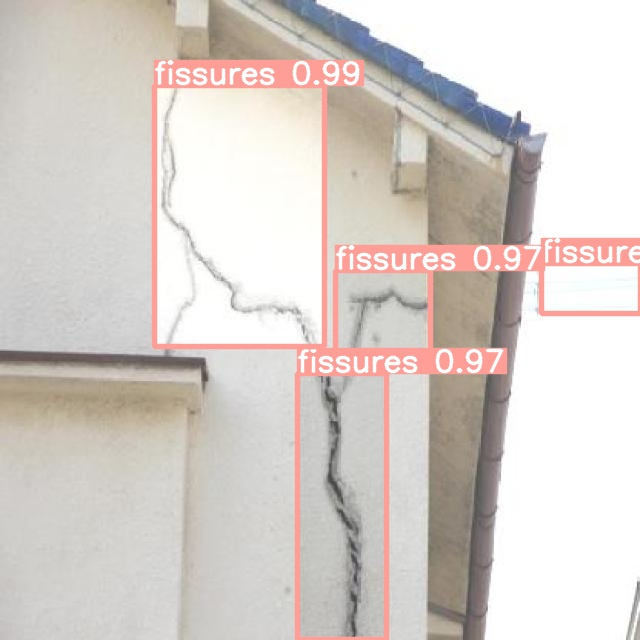

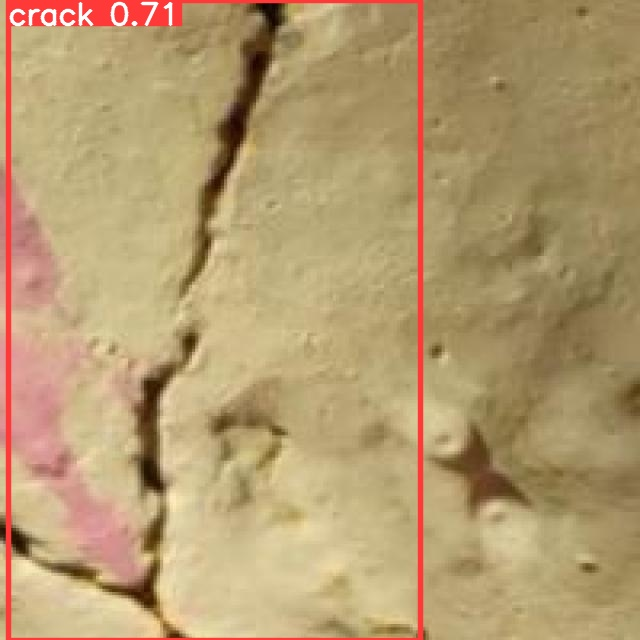

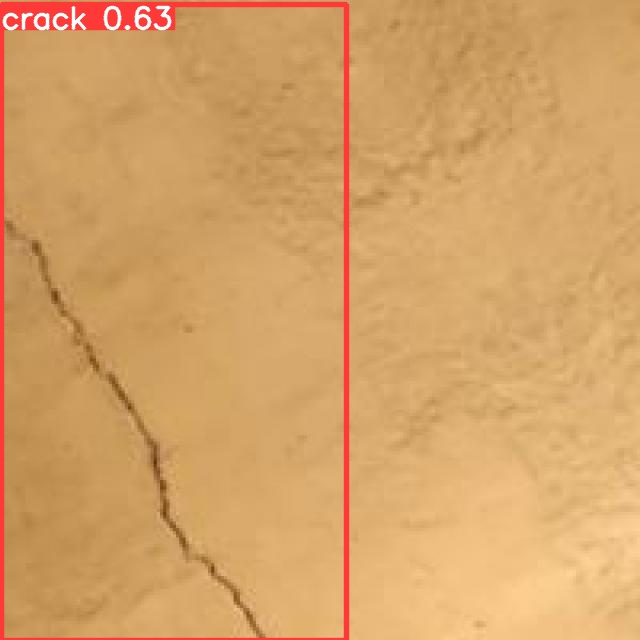

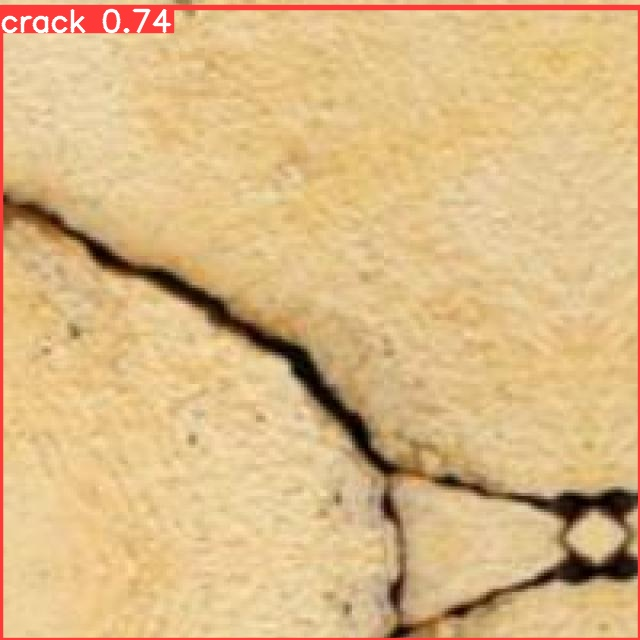

In [ ]:


for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

 ** **Detecting object on a vedio using our trained model****

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt  --conf 0.2 --source /content/bridge.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/bridge.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-318-gc0380fd8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/1319) /content/bridge.mp4: 384x640 1 fissures, 49.2ms
video 1/1 (2/1319) /content/bridge.mp4: 384x640 1 fissures, 7.5ms
video 1/1 (3/1319) /content/bridge.mp4: 384x640 3 fissuress, 7.4ms
video 1/1 (4/1319) /content/bridge.mp4: 384x640 2 fissuress, 7.4ms
video 1/1 (5/1319) /

In [ ]:
!ffmpeg -i '/content/yolov5/runs/detect/exp9/bridge.mp4' -vf "setpts=3.0*PTS" -ss 00:01:10  -to 00:01:40   -an /content/yolov5/runs/detect/exp9/vedio2.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

video_path = '/content/yolov5/runs/detect/exp9/vedio2.mp4'
mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>